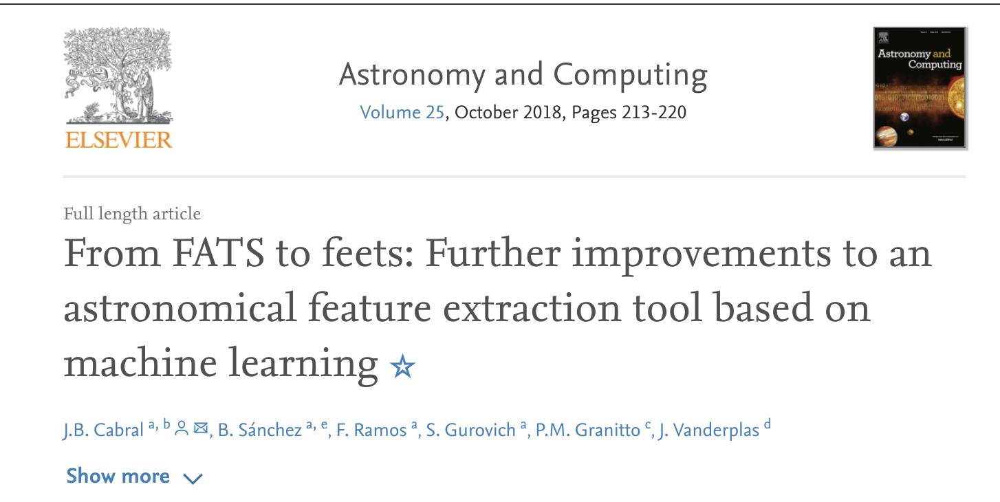

## Esto es el Vista Variables in Via-Lactea (VVV)

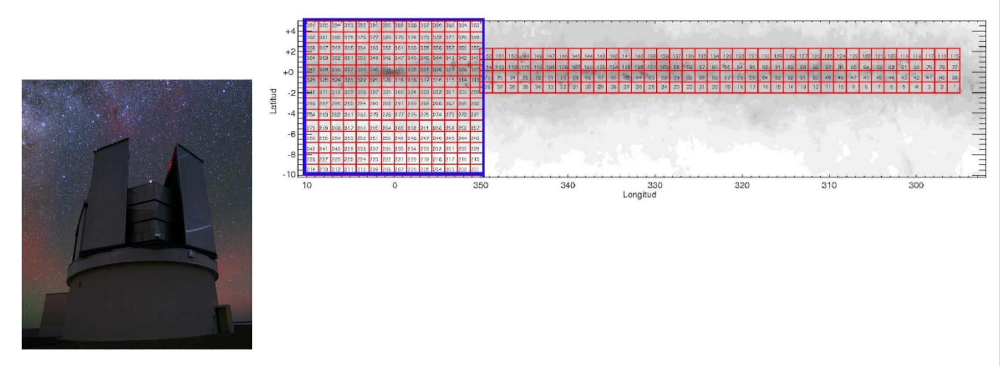

## Esto es el Vista Variables in Via-Lactea (VVV)

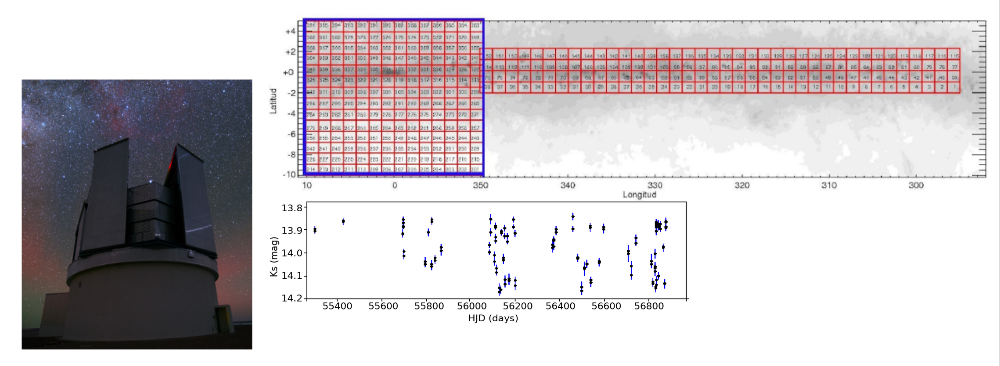

## Esto es el Vista Variables in Via-Lactea (VVV)

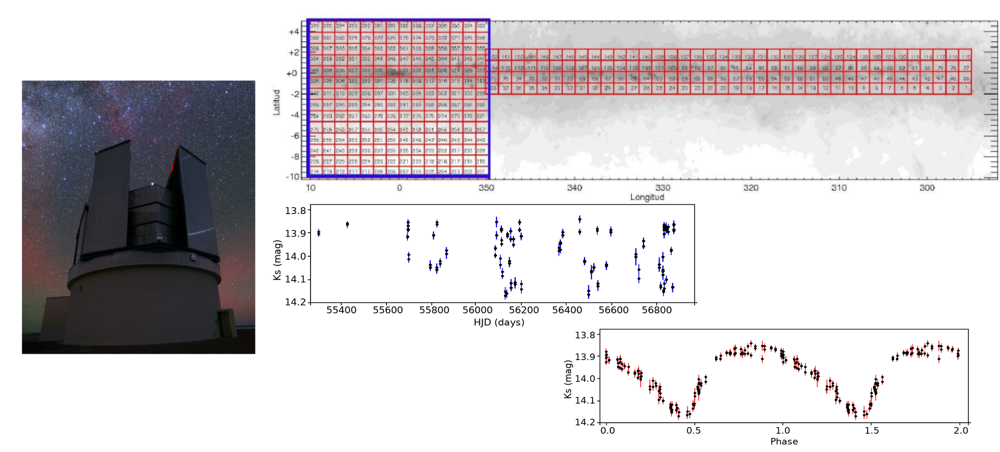

## Features Engineering

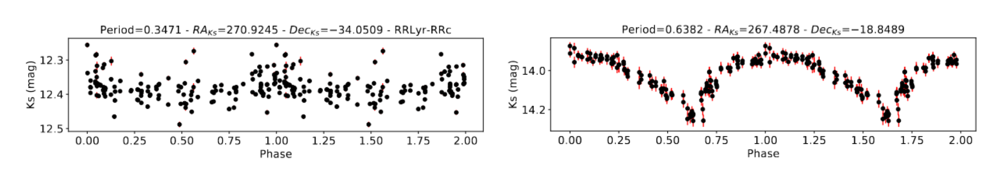

- El periodo.
- La amplitud.
- Magnitud media y desvío (Scatering).
- Tendencias.

## Win!

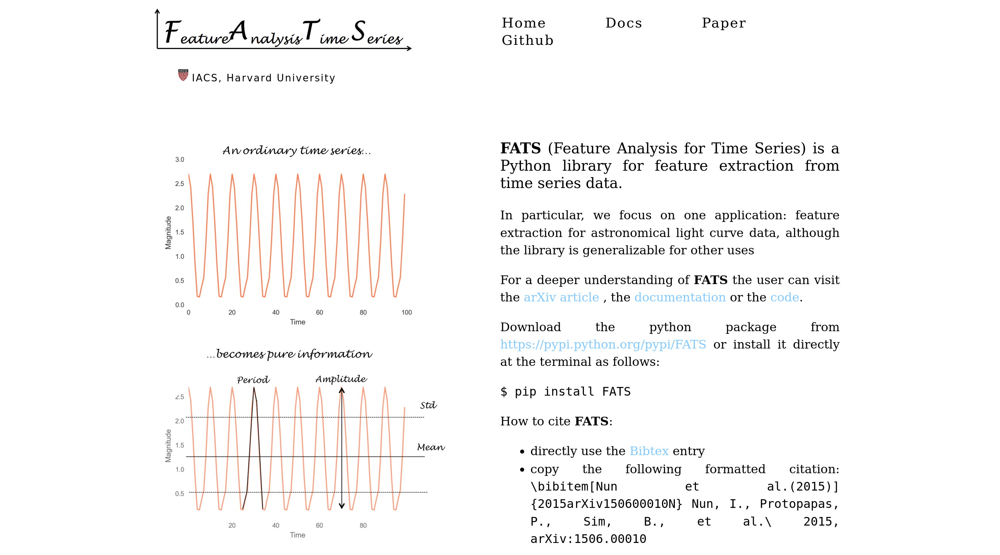

## Features Engineering

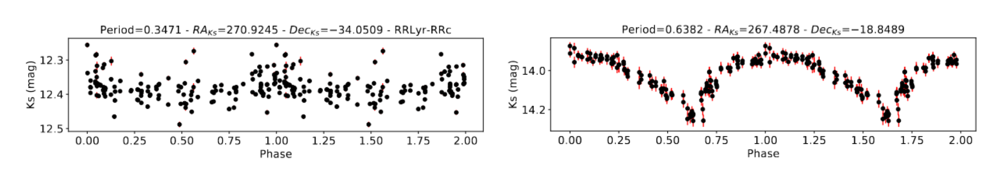

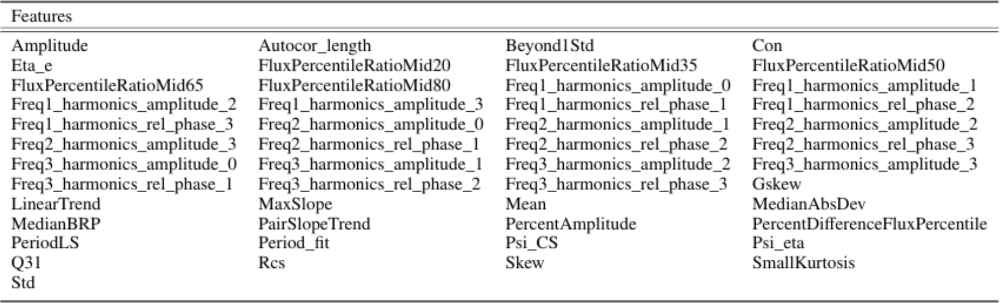

## Como se usa FATS

```python

>>> import numpy as np
>>> import FATS

# randomly generate the data
>>> magnitude_ex, time_ex = np.random.rand(30), np.arange(0, 30)

# create the light curve array
>>> lc_example = np.array([magnitude_ex, time_ex])

# create the feature space (this object serves
# as an entry point for extracting all the features)
# by specifying the available data
>>> fs = FATS.FeatureSpace(Data=['magnitude','time'])

Warning: the feature Beyond1Std could not be
calculated because
['magnitude', 'error'] are needed.
...
Warning: the feature CAR_mean could not be
calculated because
['magnitude', 'time', 'error'] are needed.

```

## Como se usa FATS

```python

# calculate the features of the light curve
>>> fs.calculateFeature(
... lc_example).result("dict")

{'Amplitude': 0.46422830004583993,
'AndersonDarling': 0.69055170152838952,
'Autocor_length': 1.0,
'Con': 0.0,
'Eta_e': 1.2660816816234817,
...
'Period_fit': 0.99987790236635843,
'Psi_CS': 0.25119898781877714,
'Psi_eta': 1.4069202501024807,
'Q31': 0.47029269745864666,
'Rcs': 0.21319202165853643,
'Skew': 0.19709543035122007,
'SmallKurtosis': -0.93310208660425609,
'Std': 0.28904604267318268}

```

## Funcionalidades - Features Extraction Framework

FATS includes a simple tool for creating your own feature extractor.

El código tiene que estar sí o si en `FATS.FeatureFunciontLib`

```python
# dentro de FATS.
class Count(Base):
    def __init__(self):
        # this attribute sets the data required to calculate the feature
        self.Data = ['time']
    
    def fit(self, data):
        # the extractor retrieves the time data from the light curve
        time = data[1]    
        # returns the number of observations
        return len(time)
```

## Funcionalidades - Features Extraction Framework

Ahora `Count` se usa así

```python
# create the feature space specify the required feature data
>>> fs = FATS.FeatureSpace(featureList=["Count"])

# calculate the features of the light curve
>>> fs.calculateFeature(lc_example).result("dict")
{'Count': 30}
```

## Funcionalidades - Extra

### Time Series Preprocessing: 
- *Sigma-clipping algorithm*
  implemented in the `FATS.PreprocessLC.Preprocess_LC` class.
- **aligning two time series** implemented in the class `FATS.alignLC.Align_LC` 

### MACHO-survey Light-Curve Parser: 

- The `FATS.import_lc_cluster.ReadLC MACHO` class retrieves the magnitude, time, and error from a given MACHO-id object.
- This implementation does not search any of the data from the MACHO survey, but instead the user is responsible for downloading the light curve to the current working directory.

## La solución

- Tengo mucho mas de lo que esperaba, con un soporte teórico barbaro.
- Hay papers! hay una tesis de MSc de hardvard.
- Tenia un tutorial brutal (http://isadoranun.github.io/tsfeat/)
- Lo recomendaban en los cursos.
- Tenia tests!
- Un solo drawback Py 2.x unicamente (que en el 2017 no era un problema, de hecho hasta numpy no andaba bien en py3)

Osea...

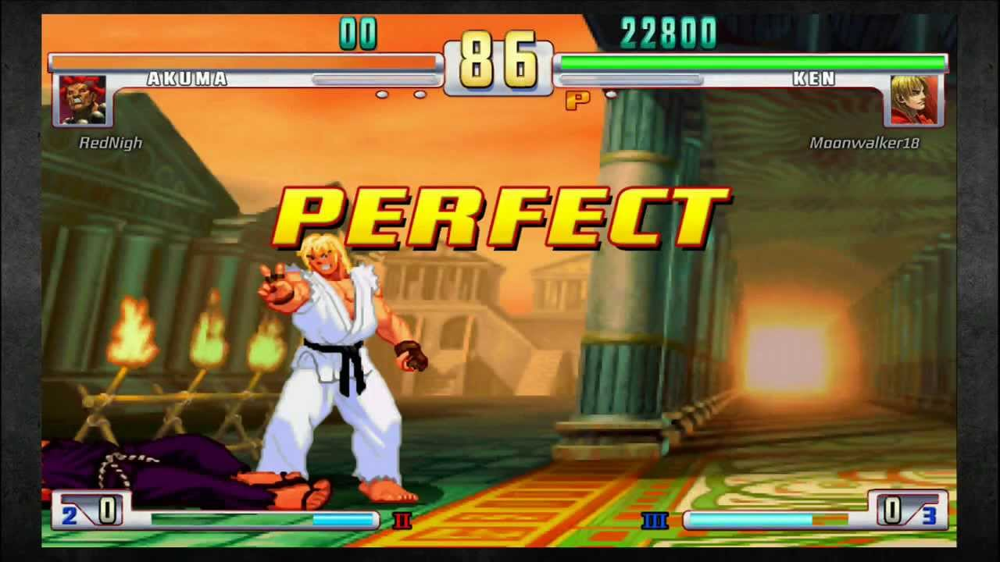

## Demo time!

Vamos a instalarlo, y veamos como se comporta. 

Mejor vamos a fijarnos el código a ver que encontramos: https://github.com/isadoranun/FATS/

# Criticas - `sys.exit(1)`

Python define los errores como excepciones por lo que ante un error, se crea un estado excepcional para informar al código llamador que "algo ha ido mal".

Por ejemplo

In [1]:
def division(a, b):
    if b == 0:
        raise Exception("b can't be 0")
    return a / b

division(1, 2)

0.5

In [2]:
division(1, 0)

Exception: b can't be 0

# Criticas - `sys.exit(1)`

Es posible tratar estos estados excepcionales con la estructura `try-except`

In [7]:
try:
    result = division(1, 0)
except Exception:
    print("algo fue mal")
    result = 1
    
print(result)

algo fue mal
1


Python provee dos tipos de Exceptions a los programadores
- Los derivados de `BaseException` que no deben ser tratados.
- Los derivados de `Exceptions` si pueden ser tratados.


# Criticas - `sys.exit(1)`

Los errores de la excepción `SystemExit` se producen cuando se llama a la función
función `sys.exit()`. 
Esta llamada a la función apaga la máquina virtual y envía el código de salida al sistema operativo.
sistema operativo. 

Por ejemplo, el siguiente fragmento de código:

```python
>>> import sys
>>> sys.exit()
```

Termina la máquina virtual de Python y envía un valor 0 (sin error) al sistema operativo.

`SystemExit` deriva de `BaseException`.

# Criticas - `sys.exit(1)`

- En FATS, esto se produce llamadas a `sys.exit()` cuando un *FeatureSpace* está configurado incorrectamente logrando que la máquina virtual Python se apague.
- Esto vuelve sistema se vuelve inestable al menos dentro de un entorno de multiproentorno de procesamiento (como un servidor web, una tubería o un
cálculo simple multinúcleo). 

```python
>>> FATS.FeatureSpace(featureList=['Foo'])
could not find feature Foo
# python ends here
```

# Criticas - `sys.exit(1)`

Se pueden, pero *no se debe*, tratar este tipo de errores de esta forma

```python
>>> try:
...    FATS.FeatureSpace(featureList=['Foo'])
... except SystemExit:
...    # some manipulation
```

## Code Smell

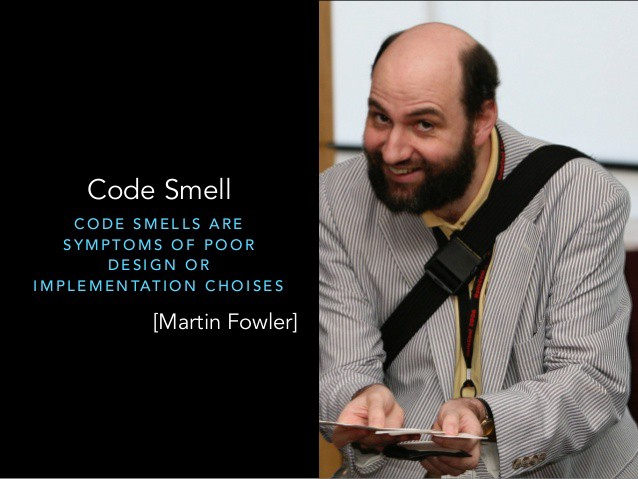

## Criticas - Inefficient Routines

Algunos problemas de rendimiento están relacionados con el cálculo de dos características: `MaxSlope` y
`PeriodLS`. 

Veamos `MaxSlope`

```python
class MaxSlope(Base):
  """..."""
  def __init__(self):
    self.Data = ['magnitude', 'time']
  def fit(self, data):
    magnitude = data[0]
    time = data[1]
    slope = (np.abs(magnitude[1:] - magnitude[:-1]) / 
      (time[1:] - time[:-1]))
    np.max(slope)
    return np.max(slope)
```

## Criticas - Estilo y mantenibilidad

- Python tiene un estilo de codificación estricto conocido como [PEP-8](https://peps.python.org/pep-0008/) 
- Este estandar documento define las directrices para que el código sea fácil de entender para cualquier desarrollador de Python. 
- Cuando un proyecto sigue estas y otras directrices, como el [PEP-20](https://peps.python.org/pep-0020/) (relacionada con la filosofía de diseño de Python), la comunidad de Python se refiere al código como "Pythonic" (fácil de entender y mantener). 
- Los errores de PEP-8 se pueden comprobar muy fácilmente con herramientas como Flake8 o pylint.



## Criticas - Estilo y mantenibilidad

- FATS no se adhiere a las recomendaciones de PEP-8.
- Se encontraron **828** errores de estilo en **1249** líneas de código 
- Es decir, el 66% de las líneas contenían errores si asumimos una distribución uniforme de los errores.

Hagamos algunas pruebas sobre el codigo actual

## Criticas - Inefficient Routines

- El problema es más complicado para `PeriodLS` 
- La  implementación del método de Lomb-Scargle que se incluye con FATS, está portada de una versión programada en lenguaje IDL, basado en la rutina publicada Numerical Recipes https://github.com/isadoranun/FATS/blob/master/FATS/lomb.py.
- El código sea difícil de mantener y tiene algunos problemas de rendimiento debido al uso incorrecto de la biblioteca \textit{Numpy}.  
- Para rematar esta implementación se aplica de forma iterativa para calcular las nueve características de Fourier.
- Quitar los features que usan esta implementacion te reduce el tiempo de cómputo en un 20%


## Criticas - Configuraciones globales

La documentación de FATS dice:

> **Note:** Some features depend on other features and consequently must be computed together. For instance, Period fit returns the false alarm probability of the estimated period. Thus, it is also necessary to calculate the period PeriodLS.

Estas dependencias esta implementadas como variables `globals`, es decir a nivel módulo.

## Criticas - Configuraciones globales

Uno de los ejemplos

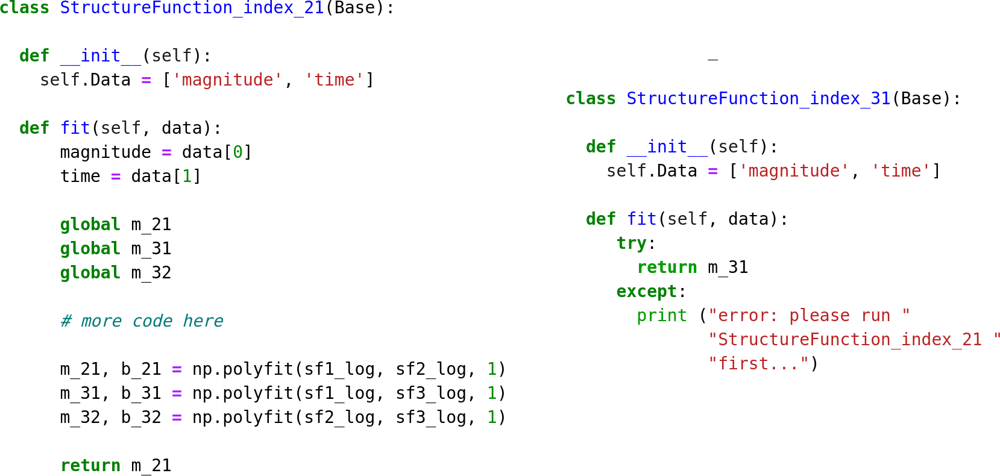

## Criticas - Configuraciones globales

Las etapas para hacer saltar un bug con esto es:

1. Creas dos curvas de luz diferentes $lc_1$ y $lc_2$.
2. Creamos un primer `FeatureSpace` $FS_a$ y extraemos **JUNTOS** los fetures inter-dependientes de la curva $lc_1$
3. Creamos un segundo `FeatureSpace` $FS_b$ y solo extraemos el feature dependiente de la curva $lc_2$.
4. El resultado va a ser el feature dependiente de $lc_1$

Cambiemos de notebook y veamos fallar esto

## Criticas - Resultados incorrectos

La [documentación de FATS](http://isadoranun.github.io/tsfeat/FeaturesDocumentation.html) dice: 

- The feature *StetsonK* for a Gaussian magnitude  distribution should take a value close to $2/\pi=0.798$. 
- For a Gaussian magnitude distribution, *StetsonJ*
  should take a value close to zero.
- For a normal distribution the \textit{Anderson-Darling} 
  statistic should take values close to $0.25$.

Se me ocurrio generar 100 mil curvas gausianas y ver como daban todos los valores

## Criticas - Resultados incorrectos

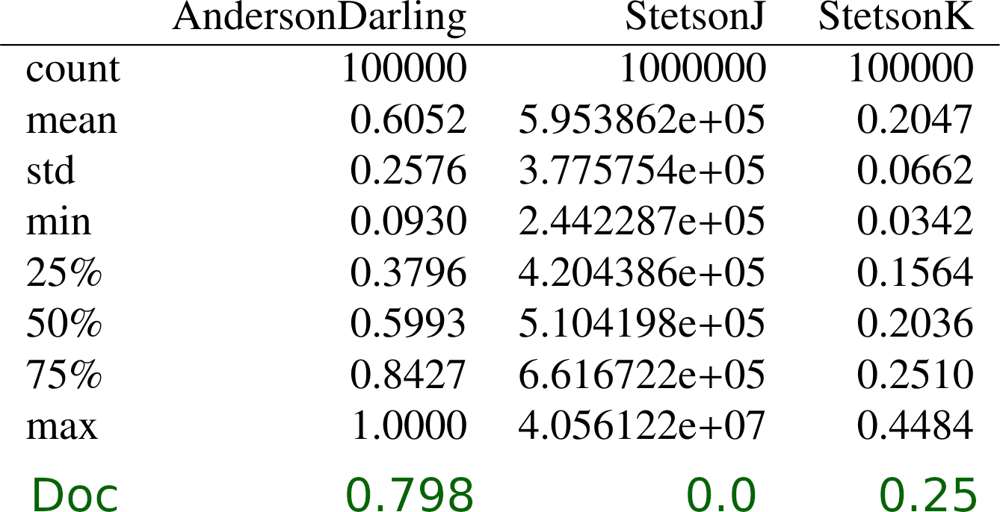

## Criticas - Testing y coverage

- La medición de las métricas cualitativas y cuantitativas de un proyecto de software implica pruebas unitarias (unit testing) y cobertura de código (code coverarge).
    - **Unit testing** intenta demostrar que cada parte del programa es correcta aislando trozos de código independientes y ejecutando pruebas sobre ellos.
    - **Code coverage** mide el porcentaje de código ejecutado por las pruebas unitarias.


## Criticas - Testing y coverage

- En el [tutorial de FATS](http://isadoranun.github.io/tsfeat/FeaturesDocumentation.html\#Appendix), se presenta un resultado estático  basado en una prueba de invariancia utilizando datos con muestreo desigual.
- El proyecto tiene **19 casos de pruebas unitarias** automatizadas y sólo una fallaba (Este problema ha sido [reportado a los autores](https://github.com/isadoranun/FATS/issues/9)
- El conjunto de pruebas sólo ejecuta el 62% de todo el código.



## Criticas - Cortitas

- **Python 3** no funciona, hacer andar esto en Python 2 es virtualmente imposible.
- **No hay documentación**.
- **El proyecto se instala sin dependencias:** esta solucionado en GitHub, pro no hay una nueva versión del proyecto desde la $1.3.6$ del 2015-06-07.
- **Light Curve Order** Se trata de un problema menor. La mayoría de los conjuntos de los dataset de la curva de luz se representan los datos en el siguiente formato: 
   
   `time` - `magnitude` - `magnitude-error`
   
   mientras que  FATS usa
   
   `magnitude` - `time` - `magnitude-error`

## Estado actual

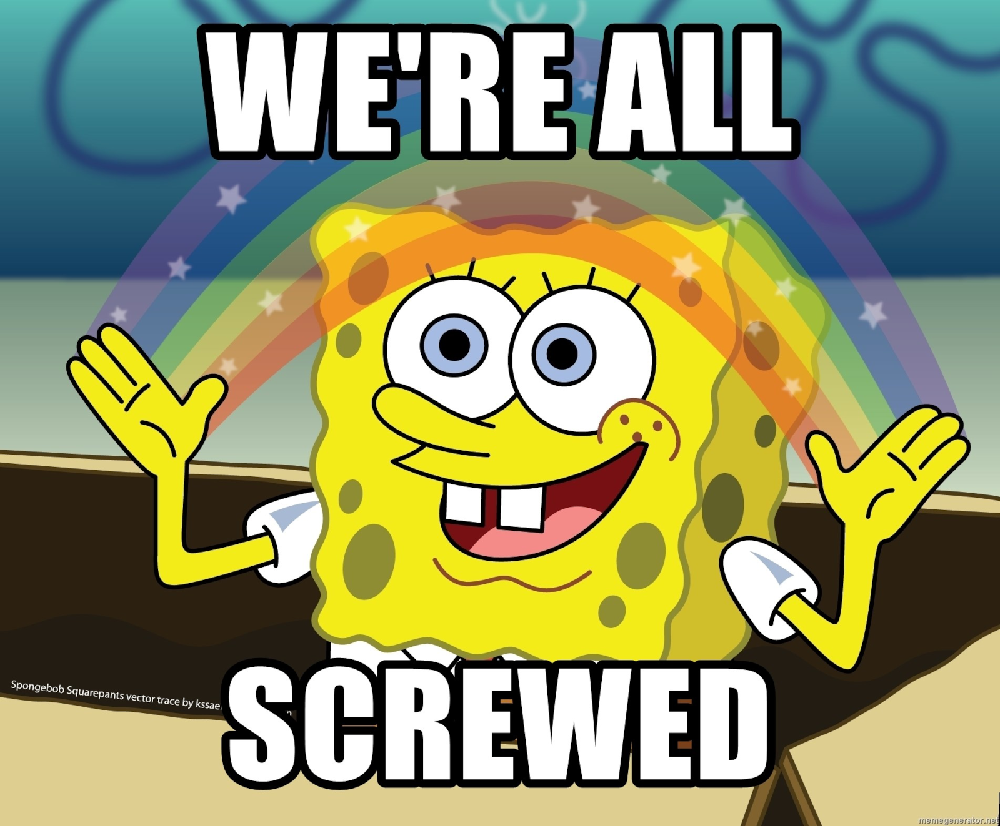

## Code Refactoring: Improving FATS

- La forma de ordenarnos frente a este problema es realizar un refactoring.
- Que es lo que mantenemos igual?
- Vamos  hacerlo siguiendo el siguiente:

    1. En primer lugar, se ejecutan todos los extractores de características de FATS  para una curva de luz de ejemplo y se almacenan los resultados.
    2. Se realiza un caso de prueba unitaria, que ejecuta los mismos extractores y comprueba si los resultados son los mismos que los almacenados.
    3. A continuación, se inicia la portación a la nueva arquitectura de forma progresiva mientras comprobamos si la prueba sigue pasando.
    4. Si un extractor cambia directamente el resultado la prueba se modifica para tener en cuenta este cambio.

## Code Refactoring: Improving FATS

Este enfoque en el que se especifica una prueba y luego se construye el código se llama desarrollo dirigido por pruebas (Test Driven Development, TDD). 

Esta técnica hace que sea más fácil confiar en que cada nuevo trozo de código escrito durante el proceso de refactorización no está generando nuevos errores de regresión.

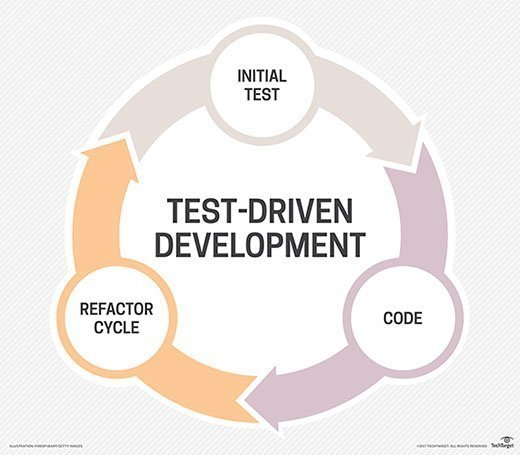

## Code Refactoring: Improving FATS

Tras la prueba inicial, el proceso de refactorización del código se divide en las siguientes seis tareas secuenciales:

1. Actualizar cada función de extracción de características manteniendo 
   manteniendo el mismo comportamiento (los resultados 
   deben ser los mismos para la misma entrada con el fin de pasar la 
   prueba inicial)
2. Escribir una nueva clase sin estado `FeatureSpace`.
3. Prueba para asegurar que cada extractor de características devuelve valores razonables, al menos al menos para las entradas esperadas habituales.
4. Continuar gregando más pruebas hasta alcanzar una cobertura de código del 90%.
5. Realizar la documentación.
6. Portar el tutorial.

## feATURES eXTRACTOR for tIME sERIES (*feets*)

- El cambio de nombre se debe al radical cambio del proyecto.
- Las funcionalidades de FATS se mantienen.
- Se solucionaron todas las cricicas.
- Se aplicaron tecnicas de manejo de errores y mensajes de "warnings" cuando un resultado no funciona como lo esperado.

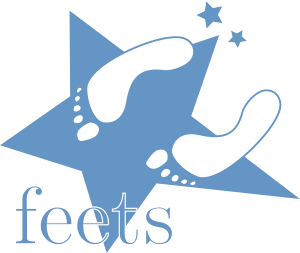

## *feets*: Cortitos

- 49 unit tests con el 90% del code coverage.
- PEP8 completo.
- Integración continua.
- Tutorial completo.
- Soporte para python 2.x y 3.x.
- Una mala configuración solo lanza exceptions.
- Los features que no dan los valores correctos lanzan un warning.
- Corregidas las dependencias.
- Se reemplazo el Lomb-Scargle por el de astropy.
- Los datos se alimentan en el formato `time`-`magnitude`-`error`.
- Se renombraron funciones con nombres confusos
    - `FATS.Preprocess_LC` `->` `remove_noise`
    - `FATS.Align_LC` `->` `align`


## *feets*: Mejor encapsulación de los extractores

- Los extractores fueron rediseñados para evitar las variables globales 
  y ahora devuelven un conjunto fijo de características, y el `FeatureSpace` descarta las que no se utilizan.
- La nueva infraestructura es realiza comprobaciones en tiempo de "compilación" con el fin de evitar comportamientos inesperados durante la extracción de características.
- Se provee la capacidad de agregar extractores sin necesidad de alterar el codigo fuente [Ejemplo](http://feets.readthedocs.io/en/latest/#Library-structure).


# La Historia Continúa: Evolución de feets

## De FATS a feets y más allá...

**Preguntas que surgieron tras la refactorización:**
- ¿La herramienta es realmente preparada para grandes volúmenes de datos?
- ¿Podemos hacer que feets sea aún más rápido y eficiente?
- ¿Cómo integrar nuevas tecnologías manteniendo la calidad?

**Trabajo de Tesis:** 

> **Optimización y paralelización de cómputo para extracción de características de estrellas variables periódicas**  
> Felipe Clariá Dambolena, 30 de Mayo de 2025

# feets 2.0: Paralelización para Gran Escala

## Soluciones implementadas:

### 🚀 Modelo de Extracción Paralelizado
- **Problema:** Ejecución secuencial = cuello de botella para grandes volúmenes
- **Solución:** Grafo de ejecución con Dask
- **Resultado:** Procesamiento distribuido y concurrente

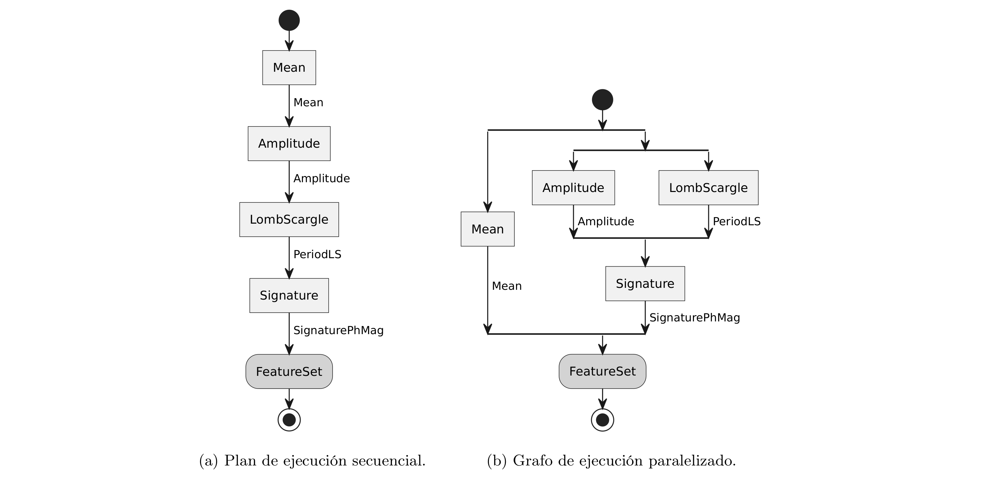

## Más Soluciones implementadas:

### 🔧 Integración con LightCurve
- Extractores optimizados escritos en Rust
- Nuevas características sin comprometer el rendimiento

### 📊 API Renovada
- Procesamiento de múltiples curvas en simultáneo
- Persistencia de configuraciones (JSON/YAML)
- Mejor interoperabilidad con el ecosistema científico

## Benchmark:

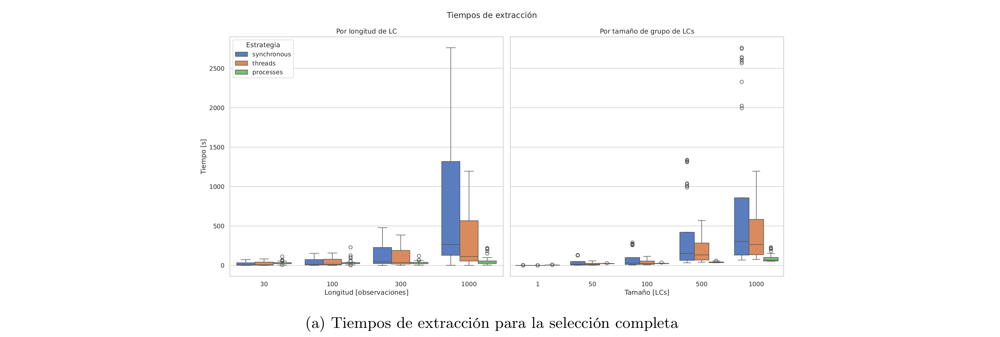

## Calidad de código

**MI Global:** 72.59 → 88.94 puntos

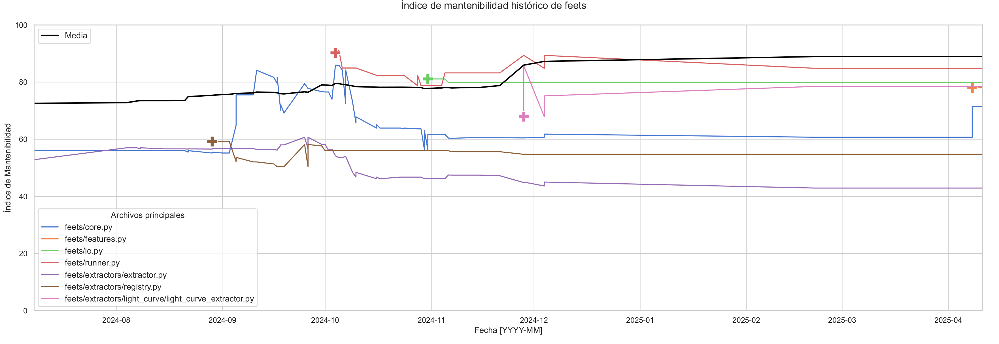